In [96]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.covariance import LedoitWolf
from scipy.optimize import minimize
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
import seaborn as sns

### Loading and Data Processing

In [40]:
df = pd.read_excel("Merged_df.xlsx")

# for yearly trend analysis
df_copy = df

df['date'] = pd.to_datetime(df['date'])
df = df.sort_values('date')
df_price = df[['date','Ticker','Close']].drop_duplicates(subset=['date','Ticker'])
price_df = df_price.pivot(
    index='date',
    columns='Ticker',
    values='Close'
)

In [41]:
df

,Unnamed: 0,Close,Ticker,year,date,companyname,Direct Greenhouse Gas Emissions (Scope 1),Indirect Greenhouse Gas Emissions (Scope 2),Indirect Greenhouse Gas Emissions (Scope 3),S&P Global ESG Score
0,0,62.944965,A,2019,2019-01-02,"Agilent Technologies, Inc.",100.0,98.0,67.0,55.0
394812,394812,48.942932,LVS,2019,2019-01-02,Las Vegas Sands Corp.,100.0,100.0,100.0,63.0
439231,439231,26.316275,MOS,2019,2019-01-02,The Mosaic Company,80.0,56.0,100.0,48.0
93054,93054,40.172016,CMS,2019,2019-01-02,CMS Energy Corporation,60.0,20.0,76.0,44.0
592984,592984,125.357597,SNA,2019,2019-01-02,Snap-on Incorporated,24.0,24.0,37.0,29.0
...,...,...,...,...,...,...,...,...,...,...
205964,205964,45.445213,EQT,2024,2024-12-11,EQT AB (publ),100.0,100.0,52.0,71.0
207461,207461,406.007660,ERIE,2024,2024-12-11,Erie Indemnity Company,19.0,16.0,18.0,23.0
625915,625915,474.820007,TDY,2024,2024-12-11,Teledyne Technologies Incorporated,72.0,87.0,31.0,34.0
201725,201725,968.533875,EQIX,2024,2024-12-11,"Equinix, Inc.",80.0,80.0,100.0,60.0


In [42]:
def find_incomplete_tickers(df):
    # Extract year-month information
    df['year_month'] = df['date'].dt.to_period('M')

    # Get the complete set of (year_month, ticker) pairs
    complete_pairs = pd.MultiIndex.from_product([df['year_month'].unique(), df['Ticker'].unique()], names=['year_month', 'Ticker'])

    # Group by year_month and ticker and get unique counts
    grouped = df.groupby(['year_month', 'Ticker']).size()

    # Reindex with the complete pairs and find missing tickers
    missing_data = grouped.reindex(complete_pairs, fill_value=0)

    # Identify tickers with missing data
    incomplete_tickers = missing_data[missing_data == 0].index.get_level_values('Ticker').unique()

    return incomplete_tickers.tolist()

In [43]:
l1 = find_incomplete_tickers(df)
l1

['FOXA',
 'DOW',
 'UBER',
 'CTVA',
 'KTB',
 'CRWD',
 'CARR',
 'OTIS',
 'DNB',
 'VNT',
 'PLTR',
 'SBNY']

In [44]:
def find_incomplete_emissions_tickers(df):
    # Required emissions columns
    emissions_cols = [
        'Direct Greenhouse Gas Emissions (Scope 1)',
        'Indirect Greenhouse Gas Emissions (Scope 2)',
        'Indirect Greenhouse Gas Emissions (Scope 3)'
    ]
    
    # Find tickers with ANY missing emissions data
    missing_emissions = (
        df[emissions_cols].isnull().any(axis=1)  # Rows with missing emissions
        .groupby(df['Ticker']).sum()             # Count per ticker
        .loc[lambda x: x > 0]                    # Tickers with >0 missing rows
        .index.tolist()
    )
    
    return missing_emissions

In [ ]:
l2 = find_incomplete_emissions_tickers(df)

In [46]:
tickers = list(set(df.Ticker))
len(tickers)

446

In [48]:
# Remove tickers which dont have data for the entirety of the period
df = df.loc[~(df.Ticker.isin(l3))]

In [49]:
tickers = list(set(df.Ticker))
len(tickers) # number of tickers left after dropping

402

In [50]:
df.drop(['Unnamed: 0'],axis=1,inplace=True)

C:\Users\anany\AppData\Local\Temp\ipykernel_24452\1617583415.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(['Unnamed: 0'],axis=1,inplace=True)


In [51]:
df = df.groupby(['Ticker', 'date']).agg({
        'Close': 'first',
        'Direct Greenhouse Gas Emissions (Scope 1)': 'mean',
        'Indirect Greenhouse Gas Emissions (Scope 2)': 'mean',
        'Indirect Greenhouse Gas Emissions (Scope 3)': 'mean',
        'S&P Global ESG Score': 'mean'
    }).reset_index()

### Analyzing Yearly Trends

In [13]:
# Compute daily % returns, NA values = 0
daily_ret = price_df.pct_change().fillna(0)
esg_col = 'S&P Global ESG Score'

# extracts ESG scores -  pivoted DataFrame similar to price data
# mean ESG scores across all dates for each ticker
esg_df = df_copy[['date','Ticker', esg_col]] \
           .drop_duplicates(subset=['date','Ticker']) \
           .pivot(index='date', columns='Ticker', values=esg_col)
pooled_esg = esg_df.mean()

# groups by year
esg_by_year = (
    df_copy
    .groupby(['year','Ticker'])[esg_col]
    .mean()
    .unstack('Ticker')    # now: rows=years, cols=tickers
)

# First, pivot each scope into a (date × ticker) DataFrame
scope_cols = [
    'Direct Greenhouse Gas Emissions (Scope 1)',
    'Indirect Greenhouse Gas Emissions (Scope 2)',
    'Indirect Greenhouse Gas Emissions (Scope 3)'
]

scope_dfs = {}
for col in scope_cols:
    scope_dfs[col] = (
        df_copy[['date','Ticker', col]]
        .drop_duplicates(subset=['date','Ticker'])
        .pivot(index='date', columns='Ticker', values=col)
    )

# Then compute year‑by‑ticker means for each scope
# Annualizes returns and covariance by multiplying by trading days + correlation matrix
TRADING_DAYS = 252
pooled_ann_ret  = daily_ret.mean() * TRADING_DAYS           # Series indexed by ticker
pooled_cov      = daily_ret.cov()  * TRADING_DAYS           # DataFrame (tickers×tickers)
pooled_corr     = daily_ret.corr()                         # DataFrame (tickers×tickers)

# 5) Year-by-year metrics
tickers = pooled_ann_ret.index
pooled_esg = pooled_esg.reindex(tickers)

scope_by_year = {}
for col, sc_df in scope_dfs.items():
    scope_by_year[col] = (
        df_copy
        .groupby(['year','Ticker'])[col]
        .mean()
        .unstack('Ticker')
        .reindex(columns=tickers)   # ensure same ticker order
    )

# Now rebuild yearly_metrics including scope1/2/3
yearly_metrics = {}
for yr, grp in daily_ret.groupby(daily_ret.index.year):
    # financials
    returns = grp.mean() * TRADING_DAYS
    cov     = grp.cov()  * TRADING_DAYS
    corr    = grp.corr()

    # ESG
    esg     = esg_by_year.loc[yr].reindex(tickers)

    # Emissions
    s1 = scope_by_year[scope_cols[0]].loc[yr].values
    s2 = scope_by_year[scope_cols[1]].loc[yr].values
    s3 = scope_by_year[scope_cols[2]].loc[yr].values

    # equal‑weight Sharpe (as before)
    w_eq    = np.ones(len(tickers)) / len(tickers)
    ret_eq  = w_eq @ returns
    vol_eq  = np.sqrt(w_eq @ cov @ w_eq)
    sharpe_eq = (ret_eq/vol_eq) if vol_eq>0 else 0

    yearly_metrics[yr] = {
        'returns': returns,
        'cov':      cov,
        'corr':     corr,
        'esg':      esg,
        'sharpe':   sharpe_eq,
        'scope1':   pd.Series(s1, index=tickers),
        'scope2':   pd.Series(s2, index=tickers),
        'scope3':   pd.Series(s3, index=tickers),
    }
for yr, metrics in yearly_metrics.items():
    for key, val in metrics.items():
        # only pandas objects support .fillna
        if isinstance(val, (pd.Series, pd.DataFrame)):
            # fill NaNs with the (column‐wise) mean
            yearly_metrics[yr][key] = val.fillna(val.mean())
        # else: scalars like 'sharpe' or plain floats—we leave them as is

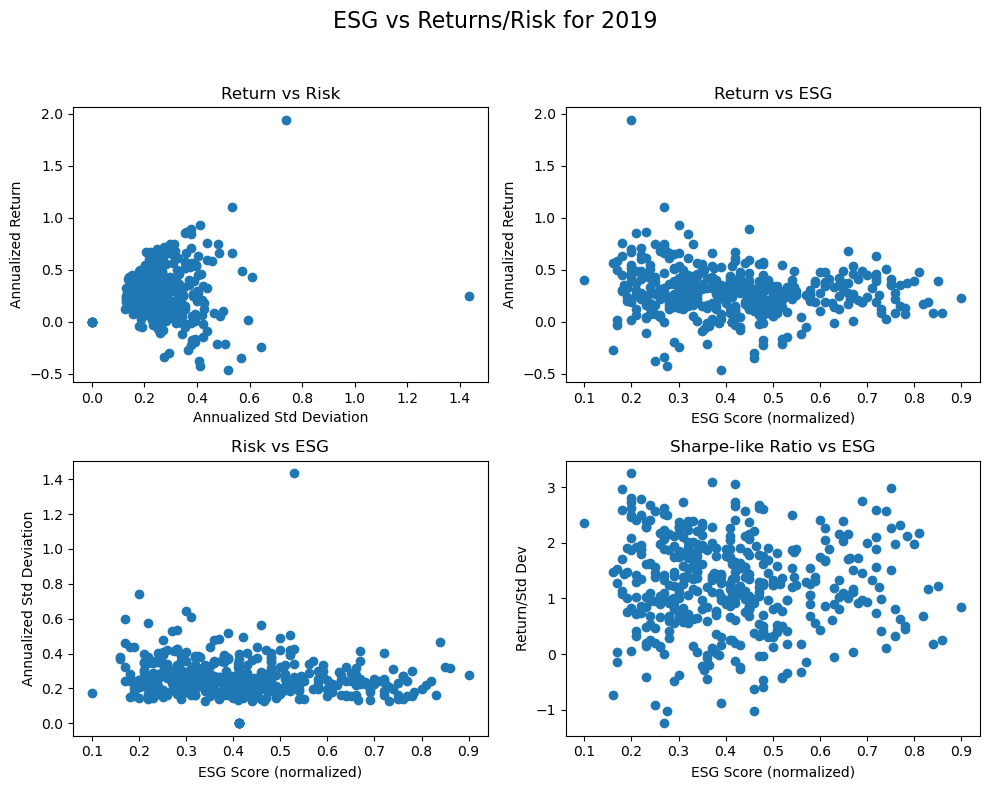

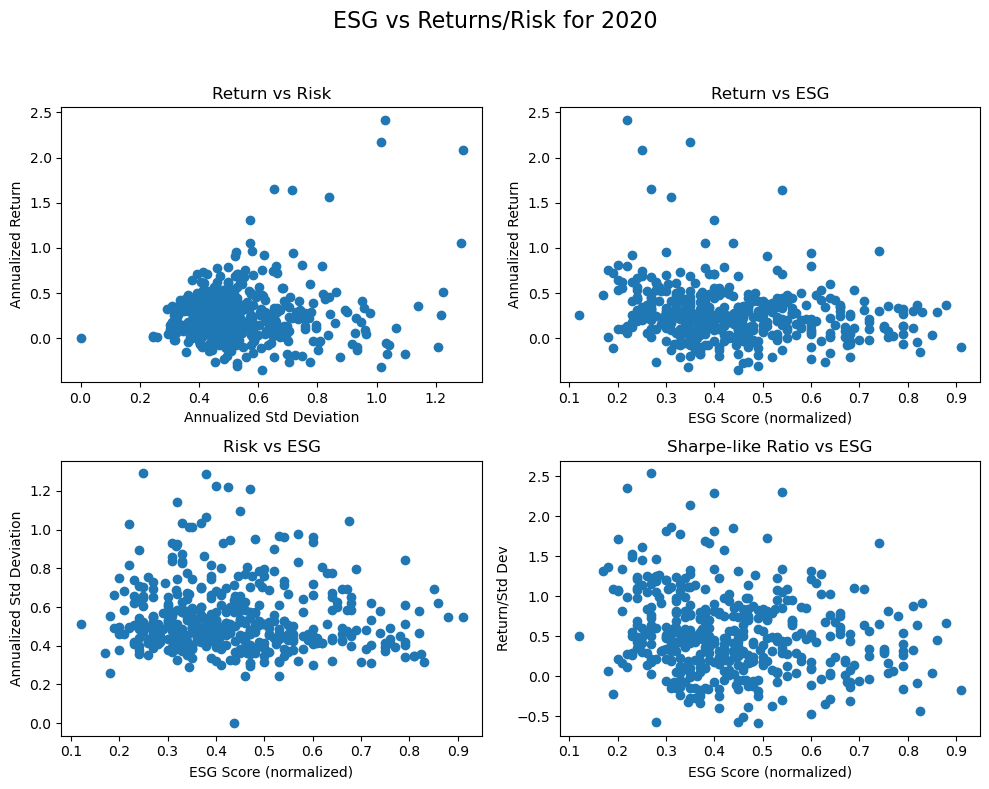

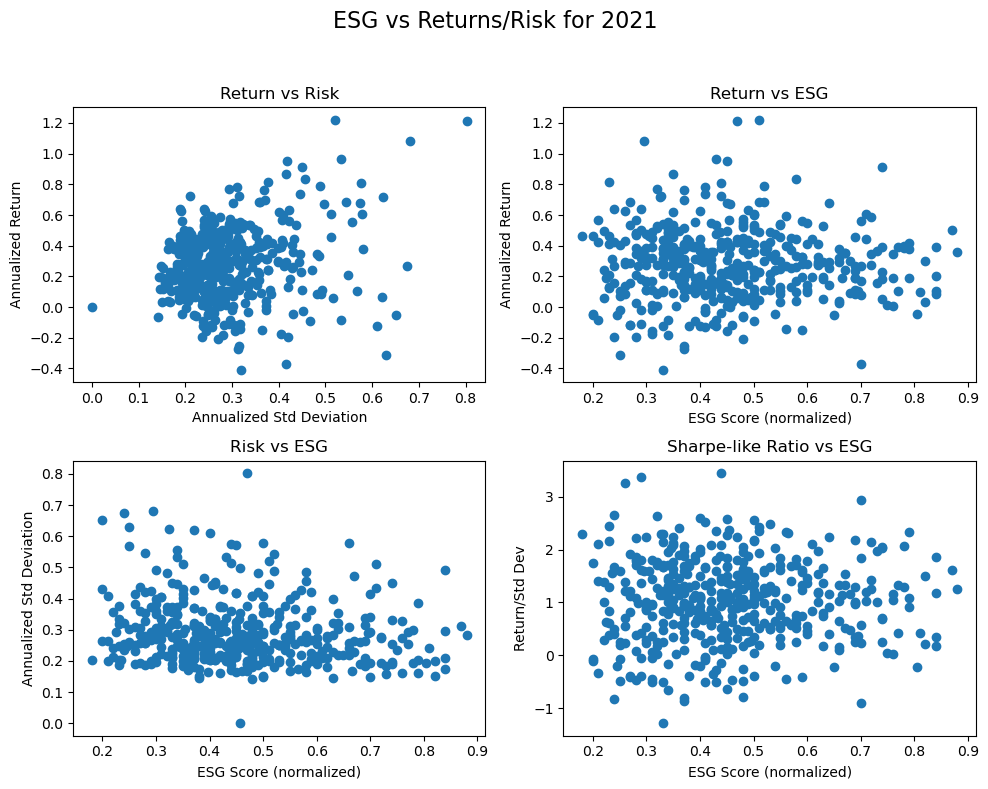

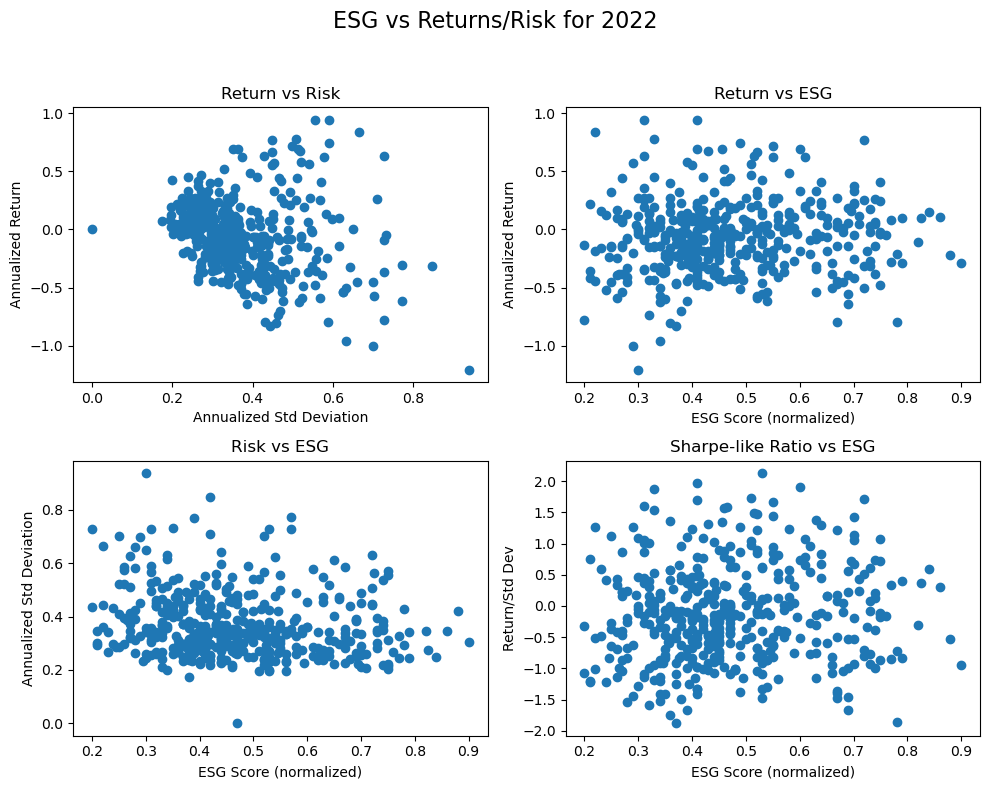

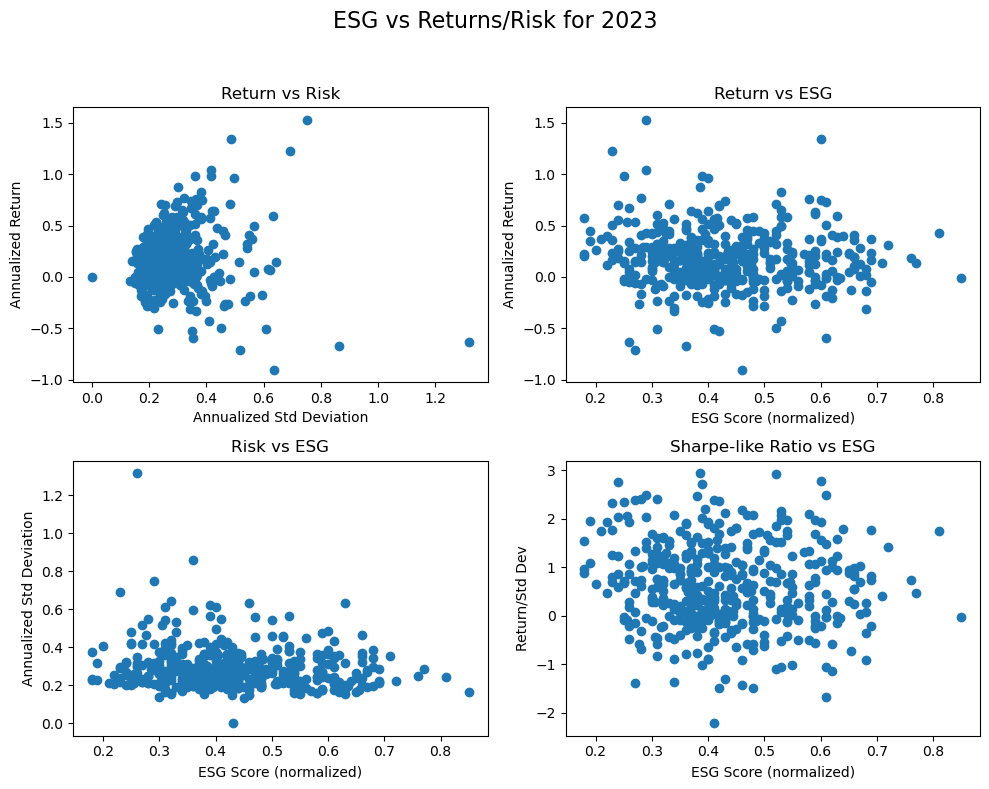

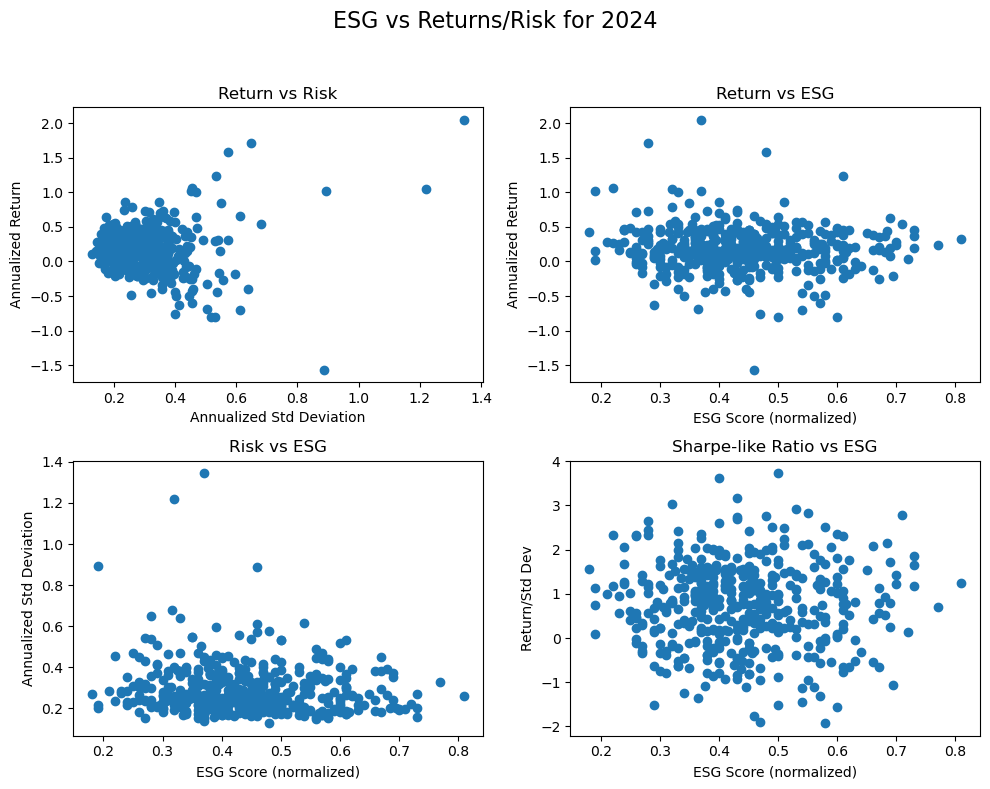

In [14]:
for yr in sorted(yearly_metrics.keys()):
    ann_ret = yearly_metrics[yr]['returns']
    cov = yearly_metrics[yr]['cov']
    esg = yearly_metrics[yr]['esg']

    # Compute per-year standard deviation
    std_dev = pd.Series(np.sqrt(np.diag(cov.values)), index=ann_ret.index)

    # Normalize ESG (0–1)
    esg_scaled = esg / 100

    # Return-to-risk ratio
    ret_over_std = ann_ret / std_dev

    # Plot 2×2 grid for this year
    fig, axs = plt.subplots(2, 2, figsize=(10, 8))
    fig.suptitle(f'ESG vs Returns/Risk for {yr}', fontsize=16)

    # Top-left: Return vs Risk
    axs[0, 0].scatter(std_dev, ann_ret)
    axs[0, 0].set_xlabel('Annualized Std Deviation')
    axs[0, 0].set_ylabel('Annualized Return')
    axs[0, 0].set_title('Return vs Risk')

    # Top-right: Return vs ESG
    axs[0, 1].scatter(esg_scaled, ann_ret)
    axs[0, 1].set_xlabel('ESG Score (normalized)')
    axs[0, 1].set_ylabel('Annualized Return')
    axs[0, 1].set_title('Return vs ESG')

    # Bottom-left: Risk vs ESG
    axs[1, 0].scatter(esg_scaled, std_dev)
    axs[1, 0].set_xlabel('ESG Score (normalized)')
    axs[1, 0].set_ylabel('Annualized Std Deviation')
    axs[1, 0].set_title('Risk vs ESG')

    # Bottom-right: Sharpe-like vs ESG
    axs[1, 1].scatter(esg_scaled, ret_over_std)
    axs[1, 1].set_xlabel('ESG Score (normalized)')
    axs[1, 1].set_ylabel('Return/Std Dev')
    axs[1, 1].set_title('Sharpe-like Ratio vs ESG')

    fig.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

### Compute Log Returns, Covariance and other Utility Functions

In [52]:
def compute_log_returns(close_prices):
    '''
      Compute log returns of stocks from closing prices. Compute mean returns and covariance matrix.

      Params:
      - close_prices: DataFrame of closing prices of stocks.

      Returns:
      - log_returns: DataFrame of log returns of stocks.
      - mean_log_returns: Series of mean log returns of stocks.
      - covariance_matrix: Numpy array of covariance matrix of log returns of stocks.
      '''
    log_returns = np.log(close_prices / close_prices.shift(1))
    log_returns = log_returns.dropna(axis = 0)
    
    mean_log_returns = log_returns.mean()
    covariance_matrix = log_returns.cov().to_numpy()
    
    return log_returns, mean_log_returns, covariance_matrix

In [53]:
def compute_linear_returns(close_prices):
    '''
    Compute daily returns of stocks from closing prices. Compute mean returns and covariance matrix.

    Params:
    - close_prices: DataFrame of closing prices of stocks.

    Returns:
    - daily_returns: DataFrame of daily returns of stocks.
    - mean_returns: Series of mean returns of stocks.
    - covariance_matrix: Numpy array of covariance matrix
    '''
    daily_returns = close_prices.pct_change().dropna(axis = 0)
    mean_returns = daily_returns.mean()
    covariance_matrix = daily_returns.cov().to_numpy()

    return daily_returns, mean_returns, covariance_matrix

In [54]:
def project_returns(closing_prices, investment_horizon):
    '''
    project the returns into longer investment_horizon

    Params:
    - closing_prices: ndarray: closing prices of assets
    - `investment_horizon`: int - multiplier for projection

    Returns:
    - ndarray of projected returns
    '''

    #1. compute log returns
    log_returns, mean_log_returns, log_covariance_matrix = compute_log_returns(closing_prices)

    #2. project log returns
    period_log_returns = investment_horizon * mean_log_returns
    period_log_covariance_matrix = investment_horizon * log_covariance_matrix

    #3. convert back to linear returns
    period_returns = np.exp(period_log_returns + 0.5 * np.diag(period_log_covariance_matrix)) - 1

    period_covariance_matrix = np.outer(period_returns + 1, period_returns + 1) * (np.exp(period_log_covariance_matrix)-1)

    return period_returns, period_covariance_matrix

In [55]:
def calculate_portfolio_returns(asset_prices, weights, cash):
    """
    Calculate the portfolio returns over a period.

    Params:
    - asset_prices : pd.DataFrame
        A DataFrame where each row represents a time period (e.g., daily) and
        each column represents an asset's price.
    - weights : array-like
        A vector of asset weights (fractions of the portfolio invested in each asset).
        These weights are assumed to remain constant over the period.
    - cash : float
        The fixed cash component held in the portfolio.

    Returns:
    -------
    - portfolio_returns : pd.Series
        A time series of portfolio returns computed as the percentage change
        in portfolio value.
    """

    # Calculate the portfolio value at each time step:
    # The dot product multiplies each asset price by its weight.
    portfolio_value = cash + asset_prices.dot(weights)

    # Compute period-to-period returns as the percentage change of portfolio value
    portfolio_returns = portfolio_value.pct_change().dropna()

    return portfolio_returns

In [56]:
def realized_sharpe_ratio(portfolio_returns, risk_free_rate=0, investment_horizon=21):
    """
    Calculate the annualized realized Sharpe ratio of a portfolio.

    The realized Sharpe ratio is defined as the mean of the excess returns
    (portfolio returns minus the risk-free rate) divided by the standard
    deviation of these excess returns, then annualized by multiplying by
    the square root of the number of periods per year.

    Parameters
    ----------
    portfolio_returns : array-like
        A list, NumPy array, or Pandas Series of portfolio returns.
    risk_free_rate : float, optional
        The risk-free rate corresponding to the return period (default is 0).
    investment_horizon : int, optional
        The length of the investment period (default is 21).

    Returns
    -------
    float
        The annualized realized Sharpe ratio.

    """
    # Calculate investment periods per year
    periods_per_year = 252 / investment_horizon

    # Calculate excess returns over the risk-free rate
    excess_returns = portfolio_returns - risk_free_rate
    # Compute sample mean and standard deviation
    mean_excess = np.mean(excess_returns)
    std_excess = np.std(excess_returns)
    # Annualize the Sharpe ratio
    sharpe_ratio = mean_excess / std_excess * np.sqrt(periods_per_year)

    return sharpe_ratio

In [57]:
def combine_portfolio_returns(df):
    """
    Combine all portfolio return series in the column 'Portfolio returns' into a single series.

    Parameters:
    - df: DataFrame with a column 'Portfolio returns' containing pandas Series objects.

    Returns:
    - combined_returns: Combined series with all portfolio returns.
    """
    # Concatenate all the series in 'Portfolio returns'
    combined_returns = pd.concat(df['Portfolio returns'].tolist()).sort_index()
    return combined_returns

def calculate_sharpe_ratio(returns, risk_free_rate=0):
    """
    Calculate the Sharpe ratio given a series of returns.

    Parameters:
    - returns: Series of returns.
    - risk_free_rate: Risk-free rate, default is 0.

    Returns:
    - Sharpe ratio.
    """
    # Compute excess returns
    excess_returns = returns - risk_free_rate
    
    # Compute mean and standard deviation
    mean_excess_return = excess_returns.mean()
    std_excess_return = excess_returns.std()
    
    # Compute annualized Sharpe ratio (assuming daily returns, 252 trading days per year)
    sharpe_ratio = mean_excess_return / std_excess_return * np.sqrt(252)
    
    return sharpe_ratio

### Clustering Methods

In [58]:
def realized_sharpe_ratio(returns, risk_free_rate=0, investment_horizon=252):
    """
    Calculate the annualized realized Sharpe ratio of a stock.
    """
    # Calculate excess returns over the risk-free rate
    excess_returns = returns - risk_free_rate

    # Compute mean and standard deviation
    mean_excess = np.mean(excess_returns)
    std_excess = np.std(excess_returns)

    # Annualize the Sharpe ratio
    sharpe_ratio = mean_excess / std_excess * np.sqrt(investment_horizon)

    return sharpe_ratio

def compute_sharpe_ratios(df):
    """
    Compute realized Sharpe ratio for each stock.
    """
    sharpe_ratios = {}
    
    for ticker in df['Ticker'].unique():
        stock_data = df[df['Ticker'] == ticker].sort_values('date')
        returns = stock_data['Close'].pct_change().dropna()
        sharpe = realized_sharpe_ratio(returns)
        sharpe_ratios[ticker] = sharpe
    
    return sharpe_ratios

##### Based on ESG scores and Sharpe Ratios

In [109]:
def cluster_stocks_esg_sharpe(df, sharpe_ratios):
    """
    Cluster stocks based on Sharpe ratio and ESG score.
    """
    # Create a DataFrame for clustering
    cluster_data = df.groupby('Ticker').agg({'S&P Global ESG Score': 'mean'}).reset_index()
    cluster_data['Sharpe Ratio'] = cluster_data['Ticker'].map(sharpe_ratios)

    # Drop stocks without Sharpe Ratio
    cluster_data.dropna(inplace=True)

    # Standardize the data
    scaler = StandardScaler()
    X = scaler.fit_transform(cluster_data[['S&P Global ESG Score', 'Sharpe Ratio']])

    # Apply KMeans clustering
    kmeans = KMeans(n_clusters=4, random_state=42)
    cluster_data['Cluster'] = kmeans.fit_predict(X)

    return cluster_data

In [110]:
def plot_clusters(cluster_data):
    """
    Plot the clusters.
    """
    plt.figure(figsize=(12, 8))
    colors = {0:'green',1:'red',2:'blue',3:'black'}

    for clusterNo in cluster_data['Cluster'].unique():
        cluster = cluster_data[cluster_data['Cluster'] == clusterNo]
        plt.scatter(cluster['S&P Global ESG Score'], cluster['Sharpe Ratio'], c=colors[clusterNo], label=str(clusterNo))#
    
    plt.xlabel('ESG Score')
    plt.ylabel('Sharpe Ratio')
    plt.title('Clustering Stocks by ESG Score and Sharpe Ratio')
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()

In [111]:
sharpe_ratios = compute_sharpe_ratios(df.loc[df['date']<pd.to_datetime('2021-01-01')])
cluster_data_1 = cluster_stocks_esg_sharpe(df, sharpe_ratios)

\\?\C:\Users\anany\AppData\Roaming\jupyterlab-desktop\envs\env_1\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


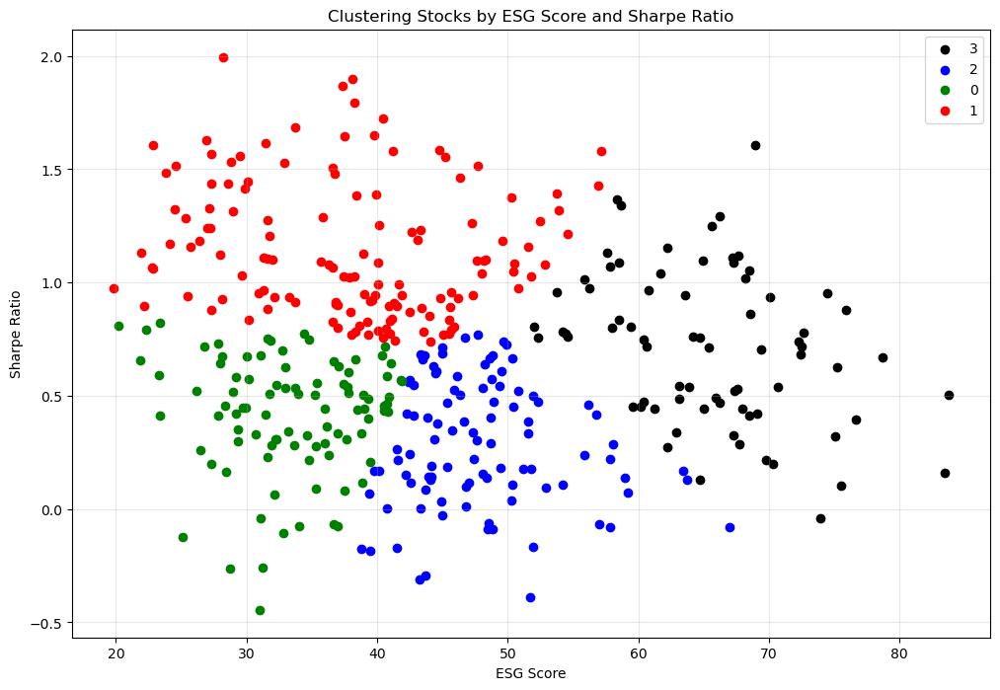

In [62]:
plot_clusters(cluster_data_1)

##### Based on ESG scores and Scope 3 Emissions

In [113]:
def cluster_stocks_esg_scope3(df):
    """
    Cluster stocks based only on ESG Score and Scope 3 Emissions.
    """
    # Prepare data
    cluster_data = df.groupby('Ticker').agg({
        'S&P Global ESG Score': 'mean',
        'Indirect Greenhouse Gas Emissions (Scope 3)': 'mean'
    }).reset_index()
    cluster_data.dropna(inplace=True)

    # Standardize features
    scaler = StandardScaler()
    X = scaler.fit_transform(cluster_data[['S&P Global ESG Score', 'Indirect Greenhouse Gas Emissions (Scope 3)']])

    # Cluster using KMeans
    kmeans = KMeans(n_clusters=4, random_state=42)
    cluster_data['Cluster'] = kmeans.fit_predict(X)

    return cluster_data

def plot_esg_scope3_clusters(cluster_data):
    """
    2D plot of ESG Score vs. Scope 3 Emissions clusters.
    """
    plt.figure(figsize=(12, 8))
    colors = {0:'green', 1:'red', 2:'blue', 3:'black'}

    for clusterNo in cluster_data['Cluster'].unique():
        cluster = cluster_data[cluster_data['Cluster'] == clusterNo]
        plt.scatter(
            cluster['S&P Global ESG Score'],
            cluster['Indirect Greenhouse Gas Emissions (Scope 3)'],
            c=colors[clusterNo],
            label=f'Cluster {clusterNo}',
            alpha=0.7
        )

    plt.xlabel('ESG Score')
    plt.ylabel('Scope 3 Emissions')
    plt.title('Clustering: ESG Score vs. Scope 3 Emissions')
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()

In [114]:
cluster_data_2 = cluster_stocks_esg_scope3(df)

\\?\C:\Users\anany\AppData\Roaming\jupyterlab-desktop\envs\env_1\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


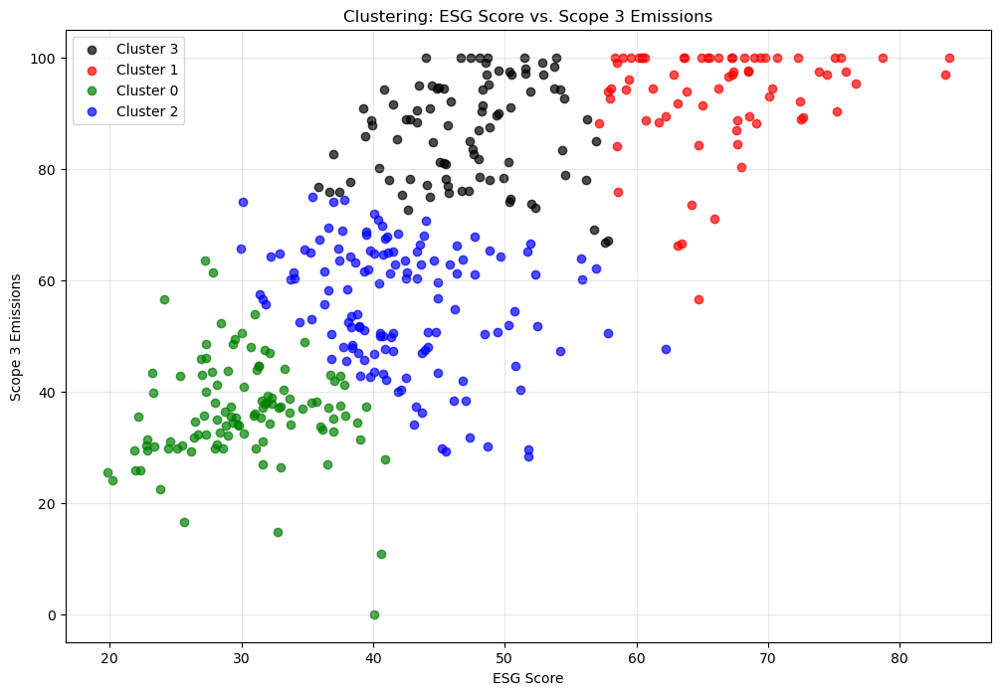

In [65]:
plot_esg_scope3_clusters(cluster_data_2)

##### Based on ESG scores, Sharpe Ratios, and Scope 3 Emissions

In [66]:
def cluster_stocks_esg_sharpe_scope3(df, sharpe_ratios):
    """
    Cluster stocks based on ESG Score, Sharpe Ratio, and Scope 3 Emissions.
    """
    cluster_data = df.groupby('Ticker').agg({
        'S&P Global ESG Score': 'mean',
        'Indirect Greenhouse Gas Emissions (Scope 3)': 'mean'
    }).reset_index()
    cluster_data['Sharpe Ratio'] = cluster_data['Ticker'].map(sharpe_ratios)
    cluster_data.dropna(inplace=True)

    # Standardize features
    scaler = StandardScaler()
    X = scaler.fit_transform(cluster_data[['S&P Global ESG Score', 'Sharpe Ratio', 'Indirect Greenhouse Gas Emissions (Scope 3)']])

    # Cluster using KMeans (3D clustering)
    kmeans = KMeans(n_clusters=4, random_state=42)
    cluster_data['Cluster'] = kmeans.fit_predict(X)

    return cluster_data

def plot_3d_clusters(cluster_data):
    """
    3D plot of clusters (ESG Score vs. Sharpe Ratio vs. Scope 3 Emissions).
    """
    fig = plt.figure(figsize=(14, 10))
    ax = fig.add_subplot(111, projection='3d')
    colors = {0:'green', 1:'red', 2:'blue', 3:'black'}

    for clusterNo in cluster_data['Cluster'].unique():
        cluster = cluster_data[cluster_data['Cluster'] == clusterNo]
        ax.scatter(
            cluster['S&P Global ESG Score'],
            cluster['Sharpe Ratio'],
            cluster['Indirect Greenhouse Gas Emissions (Scope 3)'],
            c=colors[clusterNo],
            label=f'Cluster {clusterNo}',
            s=50,
            alpha=0.7
        )

    ax.set_xlabel('ESG Score')
    ax.set_ylabel('Sharpe Ratio')
    ax.set_zlabel('Scope 3 Emissions')
    ax.set_title('3D Clustering: ESG vs. Sharpe vs. Scope 3')
    ax.legend()
    plt.show()

In [67]:
cluster_data_2 = cluster_stocks_esg_sharpe_scope3(df, sharpe_ratios)

\\?\C:\Users\anany\AppData\Roaming\jupyterlab-desktop\envs\env_1\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


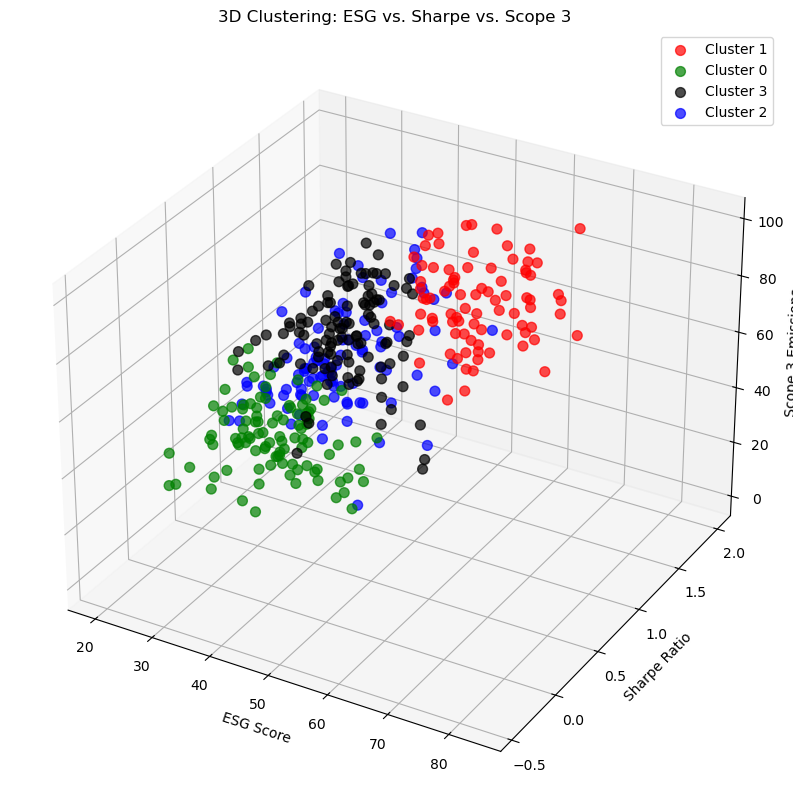

In [68]:
plot_3d_clusters(cluster_data_2)

### Portfolio Optimization Functions and Tuning the Parameters

In [69]:
# finding a reasonable threshold range for scope 1 + 2 emissions
df['Total_Emissions'] = df['Direct Greenhouse Gas Emissions (Scope 1)'] + df['Indirect Greenhouse Gas Emissions (Scope 2)']

# Get median of summed emissions per stock (across all dates)
median_emissions_per_stock = df.groupby('Ticker')['Total_Emissions'].median()
median_emissions_per_stock.median()

np.float64(125.0)

In [70]:
# to ensure no NaN avg emission scores
print("Missing Scope 1:", df['Direct Greenhouse Gas Emissions (Scope 1)'].isna().sum())
print("Missing Scope 2:", df['Indirect Greenhouse Gas Emissions (Scope 2)'].isna().sum())

Missing Scope 1: 0
Missing Scope 2: 0


In [82]:
def optimize_portfolio_sharpe(log_returns, cov_matrix, reg_on=False, U=0.003, risk_free_rate=0,
                            esg_constraint=False, esg_threshold=45, esg_data=[],
                            emission_constraint=False, emission_threshold=90, 
                            scope1_data=[], scope2_data=[]):
    """
    Optimize portfolio weights to maximize Sharpe ratio with optional constraints.
    
    Args:
        log_returns: Array of expected log returns for each asset.
        cov_matrix: Covariance matrix of returns.
        reg_on: Whether to enable variance regularization.
        U: Maximum allowed portfolio variance (if reg_on=True).
        risk_free_rate: Risk-free rate for Sharpe calculation.
        esg_constraint: Whether to enforce minimum ESG score.
        esg_threshold: Minimum acceptable weighted ESG score.
        esg_data: Array of ESG scores for each asset.
        emissions_constraint: Whether to enforce emissions limit.
        emission_threshold: Maximum allowed weighted Scope1+Scope2 emissions.
        scope1_data: Array of Scope 1 emissions for each asset.
        scope2_data: Array of Scope 2 emissions for each asset.
        
    Returns:
        Optimal weights, achieved Sharpe ratio.
    """
    num_assets = len(log_returns)

    # Objective: Minimize negative Sharpe ratio
    def objective(weights):
        portfolio_return = np.dot(weights, log_returns)
        portfolio_volatility = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights)))
        sharpe_ratio = (portfolio_return - risk_free_rate) / portfolio_volatility
        return -sharpe_ratio

    # Constraints
    constraints = [{'type': 'eq', 'fun': lambda weights: np.sum(weights) - 1}]  # Budget constraint
    
    if reg_on:
        constraints.append({'type': 'ineq', 'fun': lambda weights: U - np.dot(weights.T, np.dot(cov_matrix, weights))})
    
    if esg_constraint:
        constraints.append({'type': 'ineq', 'fun': lambda weights: np.dot(weights, esg_data) - esg_threshold})
    
    if emission_constraint:
        # Combined Scope 1 + 2 emissions constraint
        constraints.append({
            'type': 'ineq', 
            'fun': lambda weights: emission_threshold - np.dot(weights, np.array(scope1_data) + np.array(scope2_data))})

    bounds = tuple((0, 1) for _ in range(num_assets))
    initial_weights = np.ones(num_assets) / num_assets

    result = minimize(objective, initial_weights, bounds=bounds, constraints=constraints)
    
    #print("\nOptimization Success:", result.success)
    #print("Optimizer Message:", result.message)
    #print("Objective Function Value:", result.fun)

    # Check if all constraints are satisfied
    #print("\nConstraint Check:")
    #for i, con in enumerate(constraints):
    #    try:
    #        val = con['fun'](result.x)
    #        print(f"Constraint {i}: Value = {val:.6f} --> {'OK' if val >= -1e-6 else 'VIOLATED'}")
    #    except Exception as e:
    #        print(f"Constraint {i}: Error evaluating constraint: {e}")

    return result.x, -result.fun

In [83]:
# Main function for portfolio optimization with rebalancing
def portfolio_optimization_sharpe(df, rebalance_period=21, start_date='2021-01-01', end_date='2024-12-01',reg_on = False, U=0.003,esg_constraint=False,esg_constraint_test=False,emission_constraint=False, emission_constraint_test=False,testRegularization=False):
    tickers = df['Ticker'].unique()
    monthly_results = []

    for start_idx in pd.date_range(start=start_date, end=end_date, freq=f'{rebalance_period}D'):
        # Define end date for the rebalance period
        end_idx = start_idx + pd.Timedelta(days=rebalance_period)
        # Extract relevant data
        training_period_data = df[(df['date'] < start_idx)]
        period_data = df[(df['date'] >= start_idx) & (df['date'] < end_idx)]

        # Pivot to have tickers as columns and dates as index
        close_prices = period_data.pivot(index='date', columns='Ticker', values='Close')
        training_close_prices = training_period_data.pivot(index='date', columns='Ticker', values='Close')
        
        if close_prices.isnull().all().any():
            print(f"Skipping period {start_idx} to {end_idx} due to insufficient data")
            continue

        # Compute log returns and covariance matrix
        period_returns, period_covariance_matrix   = project_returns(training_close_prices, rebalance_period)
        
        latest_esg_data = df.loc[df.date<start_idx].pivot(index='date', columns='Ticker', values='S&P Global ESG Score').iloc[-1]
        latest_scope1 = df.loc[df.date < start_idx].pivot(index='date', columns='Ticker', values='Direct Greenhouse Gas Emissions (Scope 1)').iloc[-1]
        latest_scope2 = df.loc[df.date < start_idx].pivot(index='date', columns='Ticker', values='Indirect Greenhouse Gas Emissions (Scope 2)').iloc[-1]
    
        if testRegularization:
            for uVal in np.arange(0.001,0.05,0.005):
                optimal_weights, max_sharpe = optimize_portfolio_sharpe(period_returns, period_covariance_matrix,reg_on=True,U=uVal,esg_constraint=False,esg_data = latest_esg_data)
                # Calculate portfolio returns
                portfolio_returns = calculate_portfolio_returns(close_prices, optimal_weights, cash=0)
                realized_sharpe = realized_sharpe_ratio(portfolio_returns)

                realized_esg_score = np.dot(optimal_weights, latest_esg_data)
                realized_emission_score = np.dot(optimal_weights, latest_scope1 + latest_scope2)

                # Store the results
                result_row = {
                    'Start Date': start_idx,
                    'End Date': end_idx,
                    'Optimal Weights': optimal_weights,
                    'Realized Sharpe': realized_sharpe,
                    'Portfolio returns': portfolio_returns,
                    'Realized Weighted ESG Score': realized_esg_score, 
                    'Realized Weighted Emission Score': realized_emission_score, 
                    'UVal': uVal,
                }

                monthly_results.append(result_row)

                # Print weights and returns
                print(f"{start_idx} - {end_idx}: Optimal Weights: {optimal_weights}, Realized Sharpe: {realized_sharpe}")

        
        elif esg_constraint_test:
            for esg_threshold_val in range(10,70,5):
                # Optimize portfolio
                optimal_weights, max_sharpe = optimize_portfolio_sharpe(period_returns, period_covariance_matrix,reg_on=reg_on,U=U,esg_constraint=esg_constraint,esg_data = latest_esg_data,esg_threshold = esg_threshold_val)
                # Calculate portfolio returns
                portfolio_returns = calculate_portfolio_returns(close_prices, optimal_weights, cash=0)
                realized_sharpe =  realized_sharpe_ratio(portfolio_returns)
                realized_esg_score = np.dot(optimal_weights, latest_esg_data)
                realized_emission_score = np.dot(optimal_weights, latest_scope1 + latest_scope2)
                # Store the results
                result_row = {
                    'Start Date': start_idx,
                    'End Date': end_idx,
                    'esg_threshold': esg_threshold_val, 
                    'Optimal Weights': optimal_weights,
                    'Realized Sharpe': realized_sharpe,
                    'Portfolio returns': portfolio_returns,
                    'Realized Weighted ESG Score': realized_esg_score, 
                    'Realized Weighted Emission Score': realized_emission_score, 
                }

                monthly_results.append(result_row)
                #Print weights and returns
                print(f"{start_idx} - {end_idx}: Optimal Weights: {optimal_weights}, Realized Sharpe: {realized_sharpe}")

        elif emission_constraint_test:
            for emission_threshold_val in range(90,160,10):
                # Optimize portfolio
                optimal_weights, max_sharpe = optimize_portfolio_sharpe(period_returns, period_covariance_matrix,reg_on=reg_on,U=U, emission_constraint=emission_constraint, emission_threshold=emission_threshold_val, scope1_data=latest_scope1, scope2_data=latest_scope2)
                # Calculate portfolio returns
                portfolio_returns = calculate_portfolio_returns(close_prices, optimal_weights, cash=0)
                realized_sharpe =  realized_sharpe_ratio(portfolio_returns)

                realized_esg_score = np.dot(optimal_weights, latest_esg_data)
                realized_emission_score = np.dot(optimal_weights, latest_scope1 + latest_scope2)
                # Store the results
                result_row = {
                    'Start Date': start_idx,
                    'End Date': end_idx,
                    'emission_threshold': emission_threshold_val, 
                    'Optimal Weights': optimal_weights,
                    'Realized Sharpe': realized_sharpe,
                    'Portfolio returns': portfolio_returns,
                    'Realized Weighted ESG Score': realized_esg_score, 
                    'Realized Weighted Emission Score': realized_emission_score, 
                }

                monthly_results.append(result_row)
                #Print weights and returns
                print(f"{start_idx} - {end_idx}: Optimal Weights: {optimal_weights}, Realized Sharpe: {realized_sharpe}")
                
        else:
            optimal_weights, max_sharpe = optimize_portfolio_sharpe(period_returns, period_covariance_matrix,reg_on=reg_on,U=U,esg_constraint=esg_constraint,esg_data = latest_esg_data, emission_constraint=emission_constraint, scope1_data=latest_scope1, scope2_data=latest_scope2)
            # Calculate portfolio returns
            portfolio_returns = calculate_portfolio_returns(close_prices, optimal_weights, cash=0)
            realized_sharpe = realized_sharpe_ratio(portfolio_returns)

            realized_esg_score = np.dot(optimal_weights, latest_esg_data)
            realized_emission_score = np.dot(optimal_weights, latest_scope1 + latest_scope2)

            # Store the results
            result_row = {
                'Start Date': start_idx,
                'End Date': end_idx,
                'Optimal Weights': optimal_weights,
                'Realized Sharpe': realized_sharpe,
                'Portfolio returns': portfolio_returns,
                'Realized Weighted ESG Score': realized_esg_score, 
                'Realized Weighted Emissions Score': realized_emission_score,
            }

            monthly_results.append(result_row)

            # Print weights and returns
            print(f"{start_idx} - {end_idx}: Optimal Weights: {optimal_weights}, Realized Sharpe: {realized_sharpe}")

    # Create results DataFrame
    results_df = pd.DataFrame(monthly_results)
    return results_df


In [437]:
resultsCompiledVsU = portfolio_optimization_sharpe(df,reg_on=True,testRegularization=True)

2021-01-01 00:00:00 - 2021-01-22 00:00:00: Optimal Weights: [4.73808753e-11 7.84877032e-12 4.94909199e-12 4.86073690e-11
 1.22829881e-11 6.34499372e-13 4.47300648e-11 3.96925858e-12
 8.43437785e-13 4.87329382e-11 4.64860711e-12 1.11369695e-12
 1.08631886e-11 7.05309211e-12 1.49250754e-12 4.11723478e-12
 2.42466654e-11 5.13402597e-12 1.05630750e-11 4.89860245e-12
 2.34336889e-11 3.36073599e-12 5.07045175e-11 1.65792708e-02
 4.30588044e-12 4.17887683e-11 8.97819382e-12 3.88992436e-11
 1.77615136e-12 3.24345730e-13 5.72126927e-12 3.19479929e-13
 1.30310167e-10 3.30525538e-12 9.84403816e-11 6.23820656e-12
 1.63360950e-11 3.74176416e-11 2.16329408e-11 3.51889393e-11
 5.48462545e-11 5.42195151e-11 6.41172093e-14 4.86874288e-02
 1.70581703e-10 4.15526020e-12 9.78974567e-11 2.27753725e-11
 1.11354673e-01 3.10513922e-12 7.54710279e-11 1.27866664e-13
 5.95181792e-10 3.44776278e-11 1.96326246e-11 2.75499766e-11
 1.55930995e-11 1.83092679e-11 3.02184191e-11 3.83341707e-12
 7.85755753e-11 4.2028995

In [439]:
'''
aggregating and summarizing the performance of each regularization 
strength UVal across all rebalancing periods.
'''
resultsOverallVsU = []
for uVal in resultsCompiledVsU.UVal.unique():
    results_df_p = resultsCompiledVsU.loc[resultsCompiledVsU.UVal == uVal]
    combined_pf_returns = combine_portfolio_returns(results_df_p)
    overall_sharpe_ratio = calculate_sharpe_ratio(combined_pf_returns)
    average_esg_score = results_df_p['Realized Weighted ESG Score'].mean()
    resultsOverallVsU.append([uVal,overall_sharpe_ratio,average_esg_score]) 

In [440]:
resultsOverallVsU

[[0.001, 0.4649013017715134, 45.92742214458475],
 [0.006, 0.4183983493071324, 43.406917501597015],
 [0.011, 0.4453423923136152, 43.40638735881637],
 [0.016, 0.44474489845385484, 43.40946122484348],
 [0.021, 0.44478121255731856, 43.408911634595896],
 [0.026000000000000002, 0.4448954362605048, 43.40763180017459],
 [0.031, 0.444833764749504, 43.4075288213917],
 [0.036000000000000004, 0.44461115208013036, 43.407012556137204],
 [0.041, 0.44472809454099704, 43.4069628243014],
 [0.046, 0.4446749267880825, 43.4069628243014]]

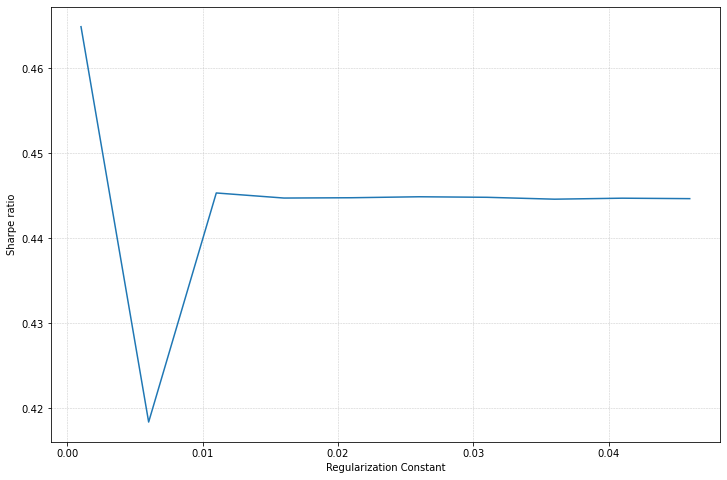

In [443]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (12, 8)
plt.plot([i[0] for i in resultsOverallVsU],[i[1] for i in resultsOverallVsU])
plt.xlabel('Regularization Constant')
plt.ylabel('Sharpe ratio')
plt.grid(visible=True, linestyle='--', linewidth=0.5, alpha=0.7)
plt.show()

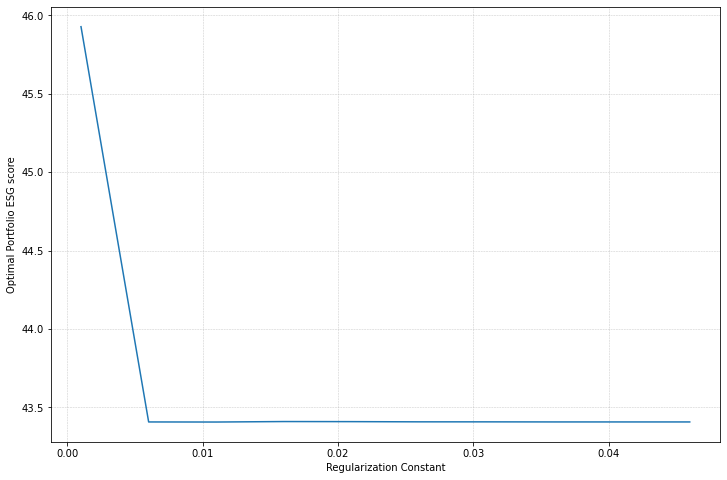

In [444]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (12, 8)
plt.plot([i[0] for i in resultsOverallVsU],[i[2] for i in resultsOverallVsU])
plt.xlabel('Regularization Constant')
plt.ylabel('Optimal Portfolio ESG score')
plt.grid(visible=True, linestyle='--', linewidth=0.5, alpha=0.7)
plt.show()

In [409]:
results_compiled = portfolio_optimization_sharpe(df)

2021-01-01 00:00:00 - 2021-01-22 00:00:00: Optimal Weights: [2.69564765e-16 0.00000000e+00 7.11417621e-16 2.77421361e-16
 0.00000000e+00 0.00000000e+00 8.01249992e-16 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 1.65567622e-15
 1.39786730e-15 1.82543870e-16 1.33914086e-16 1.18925819e-16
 8.76873931e-16 0.00000000e+00 0.00000000e+00 0.00000000e+00
 2.50796473e-16 0.00000000e+00 9.87825122e-16 0.00000000e+00
 6.52557832e-16 1.14045673e-15 0.00000000e+00 1.72956570e-15
 9.49228810e-16 0.00000000e+00 6.96488716e-02 0.00000000e+00
 0.00000000e+00 1.13317334e-16 3.06340731e-16 2.24330411e-15
 3.29448360e-15 1.78123354e-15 0.00000000e+00 2.71667223e-16
 9.70785505e-18 0.00000000e+00 1.06547948e-15 0.00000000e+00
 1.16201370e-02 0.00000000e+00 4.08627029e-16 1.82430634e-16
 9.33465952e-16 0.00000000e+00 9.86628203e-16 0.00000000e+00
 6.02084971e-02 5.61781075e-16 1.89171606e-16 0.00000000e+00
 0.00000000e+00 0.00000000e+00 1.24501254e-16 0.00000000e+00
 3.07529117e-15 0.0000000

In [421]:
%%time
results_compiled_vs_esg_threshold = portfolio_optimization_sharpe(df,U = 0,esg_constraint = True, esg_constraint_test=True)

2021-01-01 00:00:00 - 2021-01-22 00:00:00: Optimal Weights: [0.00230415 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415
 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415
 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415
 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415
 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415
 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415
 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415
 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415
 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415
 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415
 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415
 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415
 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415
 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415 0.00230415
 0

In [422]:
resultsOverallVsEsg = []
for esg_threshold in results_compiled_vs_esg_threshold.esg_threshold.unique():
    results_df_p = results_compiled_vs_esg_threshold.loc[results_compiled_vs_esg_threshold.esg_threshold == esg_threshold]
    combined_pf_returns = combine_portfolio_returns(results_df_p)
    overall_sharpe_ratio = calculate_sharpe_ratio(combined_pf_returns)
    average_esg_score = results_df_p['Realized Weighted ESG Score'].mean()
    resultsOverallVsEsg.append([esg_threshold,overall_sharpe_ratio,average_esg_score]) 

In [423]:
resultsOverallVsEsg

[[10, 0.5108547425776272, 43.40696290436409],
 [15, 0.5108547450607811, 43.40696289908181],
 [20, 0.5108547238901562, 43.40696274617498],
 [25, 0.510854737007933, 43.40696277792557],
 [30, 0.5108547363690916, 43.40696268704139],
 [35, 0.5109888395460614, 43.4075477725513],
 [40, 0.5119399761023838, 43.68892609953084],
 [45, 0.48924574009181243, 46.09870459342763],
 [50, 0.4258436982625391, 50.028764759448265],
 [55, 0.38295892919602575, 55.000000000006054],
 [60, 0.3354099544236742, 60.00000000000937],
 [65, 0.15512222155152425, 65.00000000001164]]

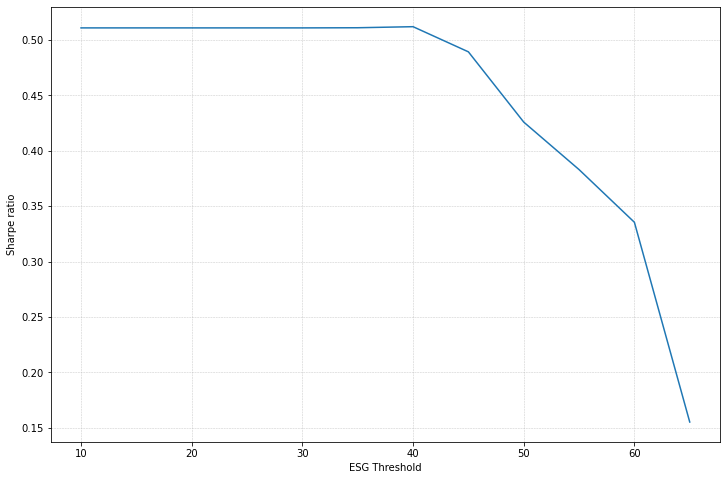

In [445]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (12, 8)
plt.plot([i[0] for i in resultsOverallVsEsg],[i[1] for i in resultsOverallVsEsg])
plt.xlabel('ESG Threshold')
plt.ylabel('Sharpe ratio')
plt.grid(visible=True, linestyle='--', linewidth=0.5, alpha=0.7)
plt.show()

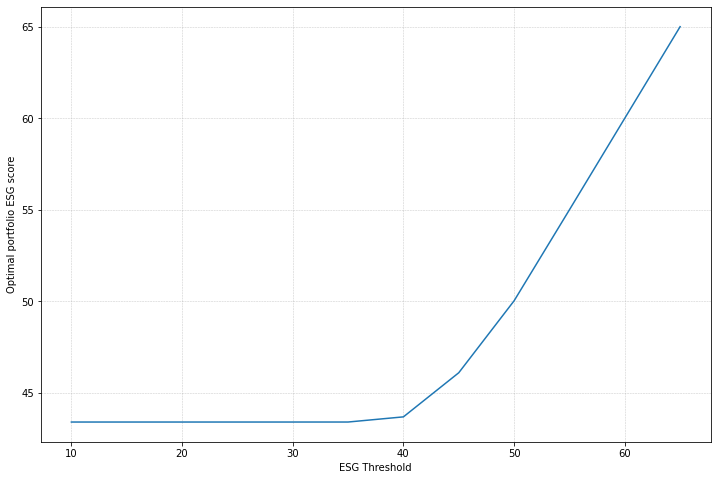

In [446]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (12, 8)
plt.plot([i[0] for i in resultsOverallVsEsg],[i[2] for i in resultsOverallVsEsg])
plt.xlabel('ESG Threshold')
plt.ylabel('Optimal portfolio ESG score')
plt.grid(visible=True, linestyle='--', linewidth=0.5, alpha=0.7)
plt.show()

In [419]:
results_compiled_vs_esg_threshold.loc[results_compiled_vs_esg_threshold.esg_threshold == 10]

,Start Date,End Date,esg_threshold,Optimal Weights,Realized Sharpe,Portfolio returns,Realized weighted Esg Score
0,2021-01-01,2021-01-22,10,"[2.6956476509731577e-16, 0.0, 7.11417620942252...",9.799048,date 2021-01-05 0.009033 2021-01-06 0.03...,NaN
12,2021-01-22,2021-02-12,10,"[3.348948305427956e-16, 0.0, 8.382492435783832...",3.512726,date 2021-01-25 -0.000306 2021-01-26 -0.01...,NaN
24,2021-02-12,2021-03-05,10,"[0.0, 5.450164639800093e-16, 2.159697812374977...",-6.940520,date 2021-02-16 0.000324 2021-02-17 -0.00...,NaN
36,2021-03-05,2021-03-26,10,"[9.17218266017168e-17, 0.0, 0.0, 0.0, 2.793849...",0.319196,date 2021-03-08 -0.044779 2021-03-09 0.05...,NaN
48,2021-03-26,2021-04-16,10,"[1.4178185552229945e-17, 5.024431594861212e-16...",4.830080,date 2021-03-29 -0.035394 2021-03-30 0.01...,NaN
...,...,...,...,...,...,...,...
768,2024-09-06,2024-09-27,10,"[4.901778507218347e-16, 0.0, 1.998212544192631...",2.572681,date 2024-09-09 0.007652 2024-09-10 -0.00...,39.652172
780,2024-09-27,2024-10-18,10,"[6.963627848520567e-16, 0.0, 0.0, 0.0, 8.64618...",3.347769,date 2024-09-30 0.006909 2024-10-01 -0.00...,40.304307
792,2024-10-18,2024-11-08,10,"[8.86458908652482e-16, 3.9510906073106254e-16,...",-3.680193,date 2024-10-21 -0.005354 2024-10-22 0.00...,40.467843
804,2024-11-08,2024-11-29,10,"[1.903835688490684e-16, 0.0, 1.228603820140902...",1.914405,date 2024-11-11 0.003811 2024-11-12 -0.00...,40.307886


In [418]:
results_compiled_vs_esg_threshold.loc[results_compiled_vs_esg_threshold.esg_threshold == esg_threshold]

,Start Date,End Date,esg_threshold,Optimal Weights,Realized Sharpe,Portfolio returns,Realized weighted Esg Score
11,2021-01-01,2021-01-22,65,"[2.6956476509731577e-16, 0.0, 7.11417620942252...",9.799048,date 2021-01-05 0.009033 2021-01-06 0.03...,NaN
23,2021-01-22,2021-02-12,65,"[3.348948305427956e-16, 0.0, 8.382492435783832...",3.512726,date 2021-01-25 -0.000306 2021-01-26 -0.01...,NaN
35,2021-02-12,2021-03-05,65,"[0.0, 5.450164639800093e-16, 2.159697812374977...",-6.940520,date 2021-02-16 0.000324 2021-02-17 -0.00...,NaN
47,2021-03-05,2021-03-26,65,"[9.17218266017168e-17, 0.0, 0.0, 0.0, 2.793849...",0.319196,date 2021-03-08 -0.044779 2021-03-09 0.05...,NaN
59,2021-03-26,2021-04-16,65,"[1.4178185552229945e-17, 5.024431594861212e-16...",4.830080,date 2021-03-29 -0.035394 2021-03-30 0.01...,NaN
...,...,...,...,...,...,...,...
779,2024-09-06,2024-09-27,65,"[4.901778507218347e-16, 0.0, 1.998212544192631...",2.572681,date 2024-09-09 0.007652 2024-09-10 -0.00...,39.652172
791,2024-09-27,2024-10-18,65,"[6.963627848520567e-16, 0.0, 0.0, 0.0, 8.64618...",3.347769,date 2024-09-30 0.006909 2024-10-01 -0.00...,40.304307
803,2024-10-18,2024-11-08,65,"[8.86458908652482e-16, 3.9510906073106254e-16,...",-3.680193,date 2024-10-21 -0.005354 2024-10-22 0.00...,40.467843
815,2024-11-08,2024-11-29,65,"[1.903835688490684e-16, 0.0, 1.228603820140902...",1.914405,date 2024-11-11 0.003811 2024-11-12 -0.00...,40.307886


In [133]:
%%time
results_compiled_vs_emission_threshold = portfolio_optimization_sharpe(df,U = 0,emission_constraint = True, emission_constraint_test=True)

2021-01-01 00:00:00 - 2021-01-22 00:00:00: Optimal Weights: [3.02762047e-17 2.99583136e-15 5.05469732e-16 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 7.40152980e-16 0.00000000e+00 8.34955591e-16 0.00000000e+00
 0.00000000e+00 2.50377135e-16 0.00000000e+00 1.22262173e-15
 0.00000000e+00 0.00000000e+00 7.49484225e-16 8.29267085e-17
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 1.07221220e-15 3.74313588e-17 3.83982858e-18
 2.00700613e-15 3.79614713e-16 0.00000000e+00 5.42525397e-15
 0.00000000e+00 0.00000000e+00 8.41334978e-16 2.21040703e-15
 3.06928101e-16 2.21363919e-03 4.90856149e-16 3.29436795e-16
 0.00000000e+00 2.27063380e-03 0.00000000e+00 5.40602141e-17
 5.76604737e-16 1.07865155e-01 0.00000000e+00 0.00000000e+00
 0.00000000e+00 7.32645950e-16 0.00000000e+00 0.00000000e+00
 0.00000000e+00 3.47999832e-16 6.39437798e-02 0.00000000e+00
 0.00000000e+00 0.00000000e+00 2.83090572e-16 1.21144602e-16
 0.00000000e+00 3.1827385

In [134]:
resultsOverallVsEmission = []
for emission_threshold in results_compiled_vs_emission_threshold.emission_threshold.unique():
    results_df_p = results_compiled_vs_emission_threshold.loc[results_compiled_vs_emission_threshold.emission_threshold == emission_threshold]
    combined_pf_returns = combine_portfolio_returns(results_df_p)
    overall_sharpe_ratio = calculate_sharpe_ratio(combined_pf_returns)
    average_emission_score = results_df_p['Realized Weighted Emissions Score'].mean()
    resultsOverallVsEmission.append([emission_threshold,overall_sharpe_ratio,average_emission_score]) 

In [135]:
resultsOverallVsEmission

[[np.int64(90), np.float64(0.4509561397974966), np.float64(84.02607885177522)],
 [np.int64(100),
  np.float64(0.4175394769395668),
  np.float64(91.41494427008307)],
 [np.int64(110), np.float64(0.411569802950829), np.float64(97.85137885713276)],
 [np.int64(120),
  np.float64(0.4272857495851016),
  np.float64(101.50233768743787)],
 [np.int64(130),
  np.float64(0.4350951746989031),
  np.float64(103.45715863653913)],
 [np.int64(140),
  np.float64(0.4327000071284034),
  np.float64(103.61352348275233)],
 [np.int64(150),
  np.float64(0.43273127824618063),
  np.float64(103.6129963819873)]]

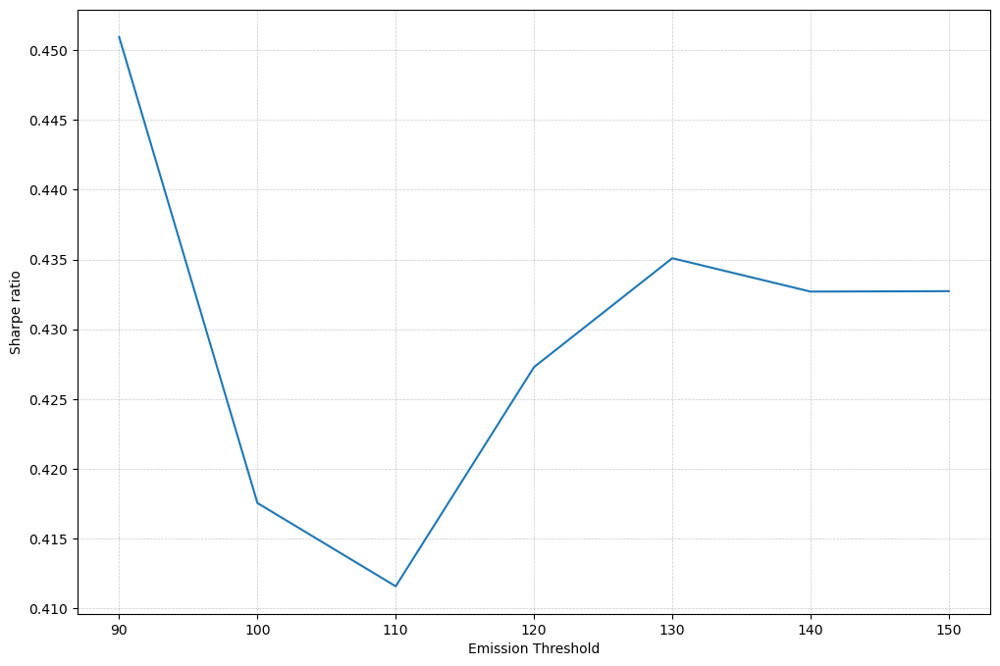

In [136]:
plt.rcParams["figure.figsize"] = (12, 8)
plt.plot([i[0] for i in resultsOverallVsEmission],[i[1] for i in resultsOverallVsEmission])
plt.xlabel('Emission Threshold')
plt.ylabel('Sharpe ratio')
plt.grid(visible=True, linestyle='--', linewidth=0.5, alpha=0.7)
plt.show()

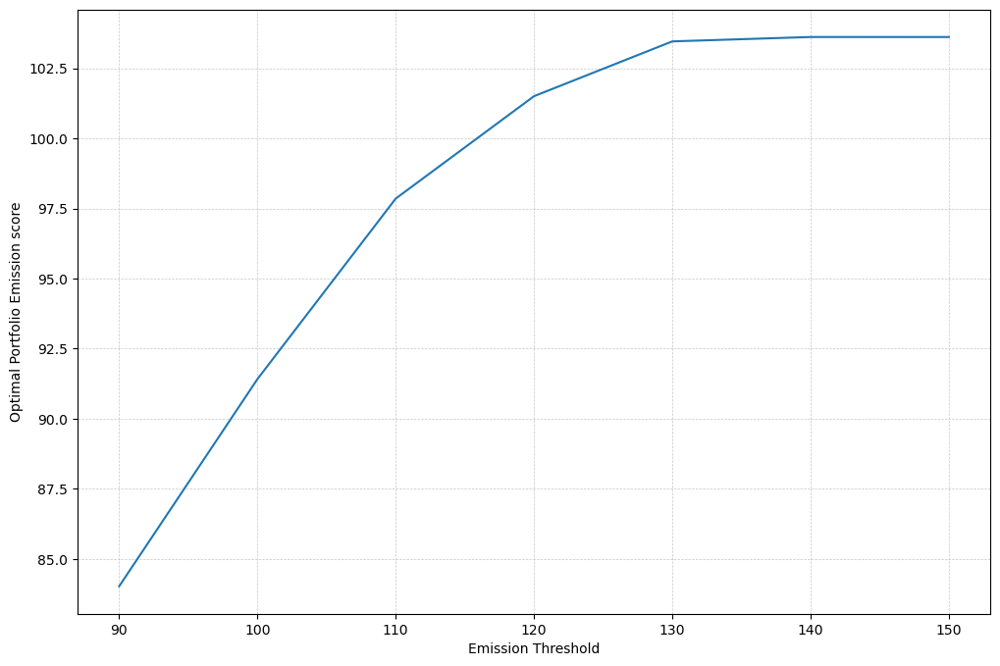

In [137]:
plt.rcParams["figure.figsize"] = (12, 8)
plt.plot([i[0] for i in resultsOverallVsEmission],[i[2] for i in resultsOverallVsEmission])
plt.xlabel('Emission Threshold')
plt.ylabel('Optimal Portfolio Emission score')
plt.grid(visible=True, linestyle='--', linewidth=0.5, alpha=0.7)
plt.show()

### Implementing Different Optimization Techniques

Tuned Parameters: 
- ESG threshold = 45
- Emissions threshold = Median (User Input)
- Reg Parameter = 0.01

##### Sharpe Optimization with ESG Constraint and Regularization

In [84]:
results_df_w_reg_esg = portfolio_optimization_sharpe(df,reg_on=True,esg_constraint = True)

2021-01-01 00:00:00 - 2021-01-22 00:00:00: Optimal Weights: [7.33777684e-16 1.21439535e-15 8.69658110e-16 5.64953687e-15
 2.38359502e-15 3.09348541e-15 1.83609891e-15 3.07410705e-15
 3.45170465e-15 3.98266078e-16 1.38304948e-15 5.05369632e-15
 3.02571010e-15 6.05978767e-16 4.73559649e-15 1.90973753e-15
 2.29085759e-15 1.37714055e-15 3.95354701e-15 3.83465844e-15
 5.25966055e-15 2.60314189e-15 2.09751542e-15 1.48287867e-15
 2.08693398e-16 7.66194900e-16 9.57094853e-16 3.47982635e-15
 9.81422660e-16 7.45428384e-16 2.42680109e-15 2.96898667e-15
 4.99151224e-15 1.66621030e-15 5.90391220e-16 6.45531274e-16
 1.96895735e-15 2.52148573e-02 1.08652285e-15 3.92075335e-16
 1.66569793e-14 1.09319151e-01 8.33618746e-16 4.64382407e-15
 1.61970278e-15 6.16579050e-02 4.76744044e-15 3.18255431e-15
 1.94601601e-15 2.87465274e-15 2.07453898e-15 3.76392497e-15
 1.71184443e-02 5.54386613e-15 5.65686614e-02 1.36186243e-02
 1.03936516e-15 3.36658339e-16 1.31198698e-15 1.47730647e-15
 7.15016832e-15 2.0405752

##### Sharpe Optimization with Regularization

In [85]:
results_df_w_reg = portfolio_optimization_sharpe(df,reg_on=True)

2021-01-01 00:00:00 - 2021-01-22 00:00:00: Optimal Weights: [1.61082435e-16 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.10568571e-15 5.90446368e-16 0.00000000e+00 0.00000000e+00
 1.35223811e-15 2.89636456e-15 0.00000000e+00 0.00000000e+00
 3.08824819e-15 5.95288669e-16 0.00000000e+00 3.82775282e-15
 4.40829859e-16 2.41824233e-15 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 3.64458831e-16 0.00000000e+00
 1.28103458e-15 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.88677236e-15 9.74807798e-16 0.00000000e+00 1.51360684e-15
 0.00000000e+00 0.00000000e+00 9.51398696e-16 0.00000000e+00
 3.61422645e-16 2.52121766e-02 1.48141788e-15 1.37905260e-16
 0.00000000e+00 1.09319704e-01 0.00000000e+00 6.58355503e-16
 0.00000000e+00 6.16583229e-02 0.00000000e+00 3.12753441e-16
 0.00000000e+00 2.37500182e-15 9.95330013e-16 3.71180747e-16
 1.71175914e-02 0.00000000e+00 5.65671814e-02 1.36174975e-02
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.0000000

##### Base Portfolio - Sharpe Optmization

In [86]:
results_df = portfolio_optimization_sharpe(df)

2021-01-01 00:00:00 - 2021-01-22 00:00:00: Optimal Weights: [0.00000000e+00 0.00000000e+00 1.28603072e-15 1.95314530e-16
 1.77303866e-16 0.00000000e+00 0.00000000e+00 0.00000000e+00
 9.78927029e-16 0.00000000e+00 2.04818427e-16 2.30452699e-15
 4.57595548e-15 0.00000000e+00 1.33048741e-17 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 5.59603847e-16 0.00000000e+00 1.18155690e-15 1.59592098e-15
 1.75953064e-15 0.00000000e+00 4.68146909e-16 0.00000000e+00
 0.00000000e+00 3.81791163e-16 2.34732416e-16 0.00000000e+00
 1.49566542e-16 3.66190052e-16 5.09553113e-16 0.00000000e+00
 4.39240801e-16 2.21364890e-03 0.00000000e+00 0.00000000e+00
 2.47353552e-15 2.27063747e-03 8.26780070e-17 9.01165883e-16
 0.00000000e+00 1.07865152e-01 9.86645030e-16 1.70606174e-16
 7.72612640e-16 0.00000000e+00 6.17147221e-16 4.96554705e-16
 0.00000000e+00 0.00000000e+00 6.39437885e-02 1.65900226e-15
 5.94924678e-17 5.08600417e-16 0.00000000e+00 0.00000000e+00
 1.13462632e-16 1.2160122

##### Sharpe Optmization with ESG and Emission Constraints along with Regularization

In [87]:
results_df_w_esg_emission_w_reg = portfolio_optimization_sharpe(df,reg_on=True,esg_constraint = True, emission_constraint=True)

2021-01-01 00:00:00 - 2021-01-22 00:00:00: Optimal Weights: [1.19091093e-17 9.25962703e-15 1.08315888e-15 4.58090434e-16
 0.00000000e+00 6.84629597e-15 1.32293018e-15 2.07399004e-15
 2.43833603e-15 1.35148374e-15 1.01620140e-15 4.77254274e-03
 2.15300833e-14 1.00252641e-15 1.17726625e-15 4.64983209e-15
 1.27669563e-15 7.05666398e-15 2.02294591e-15 3.38171980e-16
 1.65891600e-15 1.23552709e-15 7.43672493e-15 0.00000000e+00
 2.48896007e-15 4.39154738e-15 3.36729077e-15 1.61982189e-15
 1.23595076e-16 7.29263891e-16 4.70303953e-16 1.68642908e-14
 8.67078156e-16 2.93312727e-16 5.23346713e-15 2.28027600e-15
 3.38761428e-03 5.63281274e-02 6.52010328e-15 7.53862749e-16
 6.34229671e-15 4.38201533e-02 3.35290891e-15 1.58920457e-15
 4.80143751e-15 3.74219102e-02 1.05066476e-15 1.08940692e-16
 7.85540325e-15 1.12030073e-14 0.00000000e+00 1.55431412e-14
 2.88215557e-02 9.88084378e-16 6.56499016e-02 3.73504979e-02
 2.37986651e-16 1.11573549e-15 4.96383584e-15 4.34153576e-15
 2.33106519e-15 0.0000000

##### Results from the different methods

In [93]:
results_df.to_excel('Base Portfolio.xlsx')
results_df_w_reg.to_excel('Base Portfolio with Regularization.xlsx')
results_df_w_reg_esg.to_excel('Portfolio with Reg and ESG constraint.xlsx')
results_df_w_esg_emission_w_reg.to_excel('Portfolio with Reg, ESG constraint, Emission Constraint.xlsx')

In [99]:
methodsTried = ['Norm','Norm + Reg','Norm + Reg + ESG', 'Norm + Reg + ESG + Ems']

In [ ]:
methods = []
sharpe_ratios = []
esg_scores = []
emission_scores = []

resultsData = [results_df, results_df_w_reg, results_df_w_reg_esg, results_df_w_esg_emission_w_reg]
for i in range(len(resultsData)):
    results_df_p = resultsData[i]
    combined_pf_returns = combine_portfolio_returns(results_df_p)
    overall_sharpe_ratio = calculate_sharpe_ratio(combined_pf_returns)
    average_esg_score = results_df_p['Realized Weighted ESG Score'].mean()
    average_emission_score = results_df_p['Realized Weighted Emissions Score'].mean()

    methods.append(methodsTried[i])
    sharpe_ratios.append(overall_sharpe_ratio)
    esg_scores.append(average_esg_score)
    emission_scores.append(average_emission_score)

    #print('Overall Realized Sharpe Ratio for method '+ methodsTried[i] + ' = ' + str(overall_sharpe_ratio) + '\n Average ESG Score of the portoflio = ' + str(average_esg_score))
    print('Overall Realized Sharpe Ratio for method '+ methodsTried[i] + ' = ' + str(overall_sharpe_ratio) + '\n Average ESG Score of the portoflio = ' + str(average_esg_score) + '\n Average Emission (Scope 1 + Scope 2) Score of the portoflio = ' + str(average_emission_score) + '\n')

### Incorporating Clustering Analysis

##### Cluster based on ESG and Sharpe

In [106]:
methodsTried = ['Norm + Reg + ESG + Clus - Sharpe + ESG', 'Norm + Reg + ESG + Clus - ESG + S3']

In [115]:
clustersForEachStock = cluster_data_1[['Ticker','Cluster']]
dfWithClusters = pd.merge(df,clustersForEachStock,on='Ticker',how='left')
dfBestCluster = dfWithClusters.loc[dfWithClusters['Cluster']==3]

cluster_results_df = portfolio_optimization_sharpe(dfBestCluster,reg_on=True,esg_constraint = True, emission_constraint=True)

2021-01-01 00:00:00 - 2021-01-22 00:00:00: Optimal Weights: [1.69725850e-12 4.19421499e-16 7.61420754e-16 2.73922392e-11
 1.44166146e-02 1.34876027e-11 1.66264939e-13 7.99076939e-16
 1.33426092e-11 2.06699818e-11 1.64838146e-01 2.00847688e-11
 1.13541240e-15 3.29262355e-11 5.50499296e-12 1.05639167e-01
 3.97213642e-01 3.10855684e-14 1.77628350e-13 2.15351479e-02
 1.00904345e-15 7.94734942e-12 1.03915685e-11 2.84384078e-11
 3.86691782e-11 3.59218732e-17 3.75148485e-15 6.23557188e-12
 9.67639308e-12 1.11140317e-15 3.58488719e-14 5.29524373e-16
 1.18239747e-13 1.19133758e-13 2.19826020e-11 2.07068930e-13
 5.74479318e-12 5.92870704e-13 1.84508753e-16 1.20689183e-11
 6.42987101e-16 1.21536671e-15 1.46780634e-11 1.64770421e-15
 6.42084966e-14 1.68751679e-13 9.45313189e-14 3.12750110e-15
 4.70149077e-16 4.01203763e-16 6.20884301e-02 1.79391218e-01
 1.55444240e-11 1.97412615e-15 3.15569707e-15 4.53458427e-12
 6.67384580e-17 5.27204439e-17 4.86093977e-12 9.72247638e-16
 2.47509979e-16 5.5099732

##### Cluster based on ESG and Scope 3 Emissions

In [116]:
clustersForEachStock = cluster_data_2[['Ticker','Cluster']]
dfWithClusters = pd.merge(df,clustersForEachStock,on='Ticker',how='left')
dfBestCluster = dfWithClusters.loc[dfWithClusters['Cluster']==2]

cluster_results_df_2 = portfolio_optimization_sharpe(dfBestCluster,reg_on=True,esg_constraint = True, emission_constraint=True)

2021-01-01 00:00:00 - 2021-01-22 00:00:00: Optimal Weights: [1.28085990e-10 1.85618276e-09 2.52263608e-11 1.86690098e-12
 1.90104124e-11 1.29401667e-11 9.54442048e-02 1.14888237e-12
 7.76549191e-02 5.02683986e-10 1.78484046e-01 8.01344452e-10
 8.26413988e-10 1.92821765e-09 1.69926545e-11 3.95746980e-10
 1.00556452e-09 2.85527158e-11 4.01495392e-13 3.18144564e-12
 4.66748414e-13 1.98693800e-10 9.34637222e-02 8.75542482e-12
 7.82671785e-10 1.06831994e-10 5.77966719e-10 1.09485678e-12
 3.93152800e-02 3.53214838e-10 1.51097707e-13 3.00444418e-09
 3.32540194e-10 1.05034255e-02 1.25659080e-09 5.37475637e-12
 2.38536927e-09 6.71627743e-10 7.38622075e-13 4.44721437e-11
 1.92603333e-11 2.06181665e-13 1.58694288e-09 1.00718872e-12
 7.83449911e-13 1.51113837e-10 8.99314663e-13 9.14977687e-13
 1.81534594e-11 2.03233866e-09 4.50123399e-10 8.91345347e-10
 8.10693587e-10 8.86572824e-02 6.48788960e-13 1.01543101e-09
 9.76079982e-13 7.42012529e-12 1.00424052e-11 6.77493608e-14
 9.80765003e-10 2.1361771

In [119]:
cluster_results_df.to_excel('Clustering 1.xlsx')
cluster_results_df_2.to_excel('Clustering 2.xlsx')

In [ ]:
methods = []
sharpe_ratios = []
esg_scores = []
emission_scores = []

resultsData = [cluster_results_df, cluster_results_df_2]
for i in range(len(resultsData)):
    results_df_p = resultsData[i]
    combined_pf_returns = combine_portfolio_returns(results_df_p)
    overall_sharpe_ratio = calculate_sharpe_ratio(combined_pf_returns)
    average_esg_score = results_df_p['Realized Weighted ESG Score'].mean()
    average_emission_score = results_df_p['Realized Weighted Emissions Score'].mean()

    methods.append(methodsTried[i])
    sharpe_ratios.append(overall_sharpe_ratio)
    esg_scores.append(average_esg_score)
    emission_scores.append(average_emission_score)

    #print('Overall Realized Sharpe Ratio for method '+ methodsTried[i] + ' = ' + str(overall_sharpe_ratio) + '\n Average ESG Score of the portoflio = ' + str(average_esg_score))
    print('Overall Realized Sharpe Ratio for method '+ methodsTried[i] + ' = ' + str(overall_sharpe_ratio) + '\n Average ESG Score of the portoflio = ' + str(average_esg_score) + '\n Average Emission (Scope 1 + Scope 2) Score of the portoflio = ' + str(average_emission_score) + '\n')

### Results

##### Using the previous optimization output to calculate out-of-sample results

In [158]:
class PortfolioAnalyzer:
    def __init__(self, df: pd.DataFrame, weight_col: str = 'Optimal Weights', threshold: float = 0.01):
        self.df = df.copy()
        self.weight_col = weight_col
        self.threshold = threshold
        self._parse_weights()

    def _parse_weights(self):
        def parse_array(cell):
            try:
                cleaned = cell.strip('[] \n')
                return np.fromstring(cleaned, sep=' ')
            except Exception:
                return np.nan
        self.df['weights'] = self.df[self.weight_col].apply(parse_array)

    def count_nonzero_weights(self):
        def count_values_gt_0_01(cell):
            try:
                cleaned = cell.strip('[] \n')
                arr = np.fromstring(cleaned, sep=' ')
                return np.sum(arr > self.threshold)
            except Exception:
                return np.nan
        self.df['Weights Count'] = self.df[self.weight_col].apply(count_values_gt_0_01)

    def compute_turnover(self):
        turnovers = [np.nan]
        for i in range(1, len(self.df)):
            w_now = self.df.loc[i, 'weights']
            w_prev = self.df.loc[i - 1, 'weights']
            if isinstance(w_now, np.ndarray) and isinstance(w_prev, np.ndarray) and len(w_now) == len(w_prev):
                turnover = np.sum(np.abs(w_now - w_prev))
                turnovers.append(turnover)
            else:
                turnovers.append(np.nan)
        self.df['turnover'] = turnovers

    def compute_add_sub_remain(self):
        def get_weight_flags(weights):
            return weights > self.threshold

        additions, subtractions, remaining = [np.nan], [np.nan], [np.nan]
        for i in range(1, len(self.df)):
            w_now = self.df.loc[i, 'weights']
            w_prev = self.df.loc[i - 1, 'weights']
            if isinstance(w_now, np.ndarray) and isinstance(w_prev, np.ndarray) and len(w_now) == len(w_prev):
                flag_now = get_weight_flags(w_now)
                flag_prev = get_weight_flags(w_prev)
                additions.append(np.sum(flag_now & ~flag_prev))
                subtractions.append(np.sum(~flag_now & flag_prev))
                remaining.append(np.sum(flag_now & flag_prev))
            else:
                additions.append(np.nan)
                subtractions.append(np.nan)
                remaining.append(np.nan)
        self.df['additions'] = additions
        self.df['subtractions'] = subtractions
        self.df['remaining'] = remaining

    def describe(self):
        return self.df.describe()

    def get_df(self):
        return self.df

# Example usage
file_paths = [
    "Base.xlsx",
    "Base, Regularization.xlsx",
    "Base, Regularization and ESG.xlsx",
    "Base, Regularization, ESG, and Emission.xlsx",
    "Base, Regularization, ESG, and Emission, Clustering with ESG and Sharpe.xlsx",
    "Base, Regularization, ESG, and Emission, Clustering with ESG and Scope 3.xlsx"
]

analyzers = []
summary_df = pd.DataFrame()
for path in file_paths:
    df = pd.read_excel(path)
    analyzer = PortfolioAnalyzer(df)
    analyzer.count_nonzero_weights()
    analyzer.compute_turnover()
    analyzer.compute_add_sub_remain()
    mean_row = analyzer.describe().loc['mean']
    strategy_name = path.replace('.xlsx', '')  # Clean column name
    summary_df[strategy_name] = mean_row


summary_df = summary_df.T
summary_df = summary_df.drop(columns=['Unnamed: 0', 'Start Date', 'End Date', 'additions', 'subtractions', 'remaining'])
decimals = 0    
summary_df['Weights Count'] = summary_df['Weights Count'].apply(lambda x: round(x, decimals))
display(summary_df)

,Realized Sharpe,Realized Weighted ESG Score,Realized Weighted Emissions Score,Weights Count,turnover
Base,1.086363,42.52168,103.612997,14.0,0.255187
"Base, Regularization",1.180658,45.732186,115.825401,17.0,0.217898
"Base, Regularization and ESG",1.161626,46.864596,117.856654,17.0,0.219581
"Base, Regularization, ESG, and Emission",1.302871,45.21599,90.0,17.0,0.207478
"Base, Regularization, ESG, and Emission, Clustering with ESG and Sharpe",0.572899,60.421812,90.000002,7.0,0.125423
"Base, Regularization, ESG, and Emission, Clustering with ESG and Scope 3",1.455907,45.038855,90.000001,16.0,0.162667


##### Plots

        Method Realized Sharpe Realized Weighted ESG Score  \
0  Portfolio 1        1.086363                    42.52168   
1  Portfolio 2        1.180658                   45.732186   
2  Portfolio 3        1.161626                   46.864596   
3  Portfolio 4        1.302871                    45.21599   
4  Portfolio 5        0.572899                   60.421812   
5  Portfolio 6        1.455907                   45.038855   

  Realized Weighted Emissions Score  Weights Count  turnover  
0                        103.612997           14.0  0.255187  
1                        115.825401           17.0  0.217898  
2                        117.856654           17.0  0.219581  
3                              90.0           17.0  0.207478  
4                         90.000002            7.0  0.125423  
5                         90.000001           16.0  0.162667  


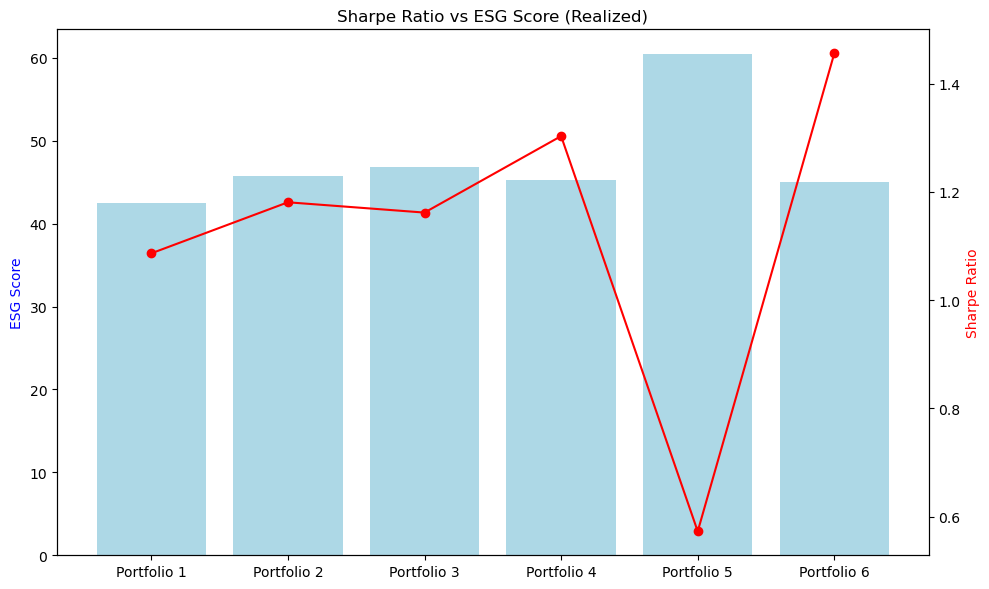

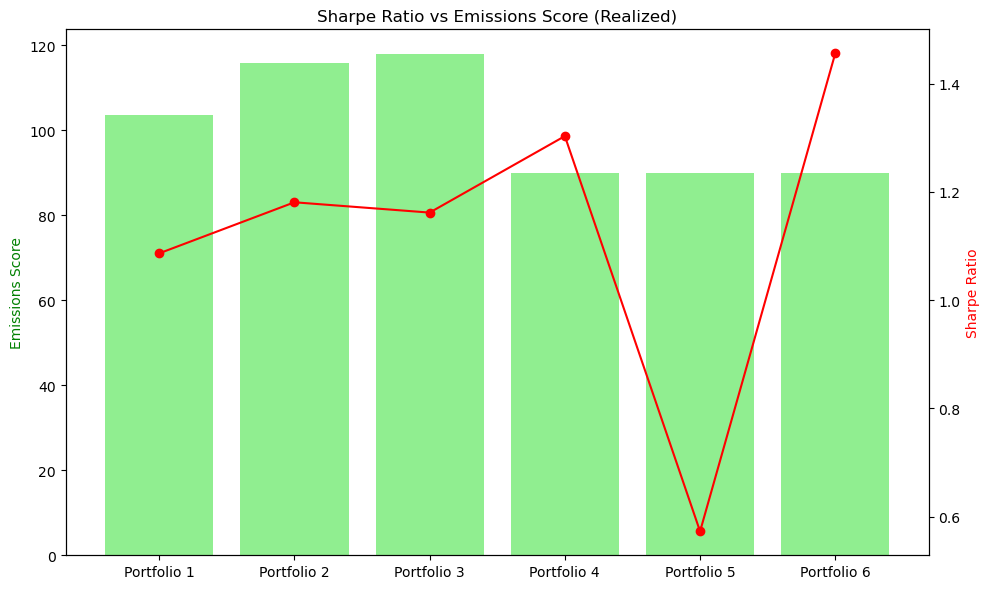

In [159]:
df = summary_df.copy()
df.reset_index(inplace=True)
df.rename(columns = {"index":"Method"},inplace=True)

df["Method"] = ["Portfolio 1","Portfolio 2","Portfolio 3","Portfolio 4","Portfolio 5","Portfolio 6"]

print(df)
# Plot 1: Sharpe vs ESG Score
fig, ax1 = plt.subplots(figsize=(10, 6))
ax2 = ax1.twinx()

bars = ax1.bar(df['Method'], df['Realized Weighted ESG Score'], color='lightblue', label='ESG Score')
line = ax2.plot(df['Method'], df['Realized Sharpe'], color='red', marker='o', label='Sharpe Ratio')

ax1.set_ylabel("ESG Score", color='blue')
ax2.set_ylabel("Sharpe Ratio", color='red')
ax1.set_title("Sharpe Ratio vs ESG Score (Realized)")

plt.xticks(rotation=45, ha='right')
fig.tight_layout()
plt.show()

# Plot 2: Sharpe vs Emissions Score
fig, ax1 = plt.subplots(figsize=(10, 6))
ax2 = ax1.twinx()

bars = ax1.bar(df['Method'], df['Realized Weighted Emissions Score'], color='lightgreen', label='Emissions Score')
line = ax2.plot(df['Method'], df['Realized Sharpe'], color='red', marker='o', label='Sharpe Ratio')

ax1.set_ylabel("Emissions Score", color='green')
ax2.set_ylabel("Sharpe Ratio", color='red')
ax1.set_title("Sharpe Ratio vs Emissions Score (Realized)")

plt.xticks(rotation=45, ha='right')
fig.tight_layout()
plt.show()